# Practical work on deformable models

In [443]:
#%% SECTION 1 inclusion of packages

import progressbar
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
# necessite scikit-image
from skimage import io as skio
from skimage.filters import gaussian
from skimage.segmentation import active_contour
from skimage import img_as_float, data, color
from skimage.segmentation import chan_vese
from skimage.segmentation import checkerboard_level_set
from skimage.segmentation import disk_level_set
import matplotlib.cm as cm


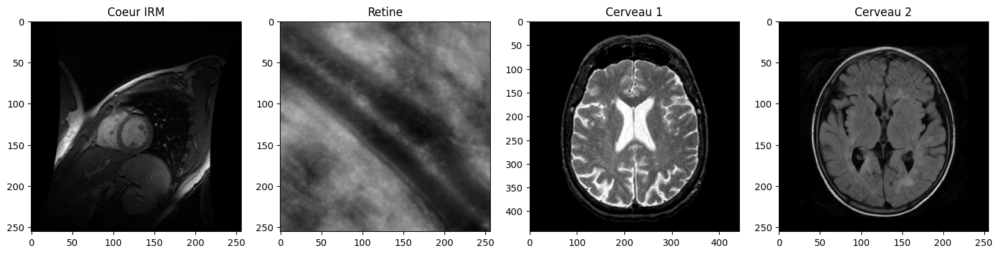

In [ ]:
#%% SECTION 2 - Input image

imIRM=skio.imread('coeurIRM.bmp')

imRET=skio.imread('retineOA.bmp')

imBRAIN=skio.imread('brain.bmp')
imBRAIN=imBRAIN[:,:,1]

imBRAIN2=skio.imread('brain2.bmp')

images = [imIRM, imRET, imBRAIN, imBRAIN2]
imagesnames = ['Coeur IRM', 'Retine', 'Cerveau 1', 'Cerveau 2']

axs = (plt.figure(figsize=(15,20),constrained_layout=False)
       .subplots(1, 4, sharex=False, sharey=False))
axs[0].imshow(imIRM,cmap="gray",vmin=0, vmax=255)
axs[0].set_title('Coeur IRM')
axs[1].imshow(imRET,cmap="gray",vmin=0, vmax=255)
axs[1].set_title('Retine')
axs[2].imshow(imBRAIN,cmap="gray",vmin=0, vmax=255)
axs[2].set_title('Cerveau 1')
axs[3].imshow(imBRAIN2,cmap="gray",vmin=0, vmax=255)
axs[3].set_title('Cerveau 2')

plt.tight_layout()
plt.show()

In [ ]:
#%% SECTION 3a - Segmentation using active contours

def sac(im, imname, init, params, paramtested):  # params = ['boundary_condition', 'alpha', 'beta', 'w_line', 'w_edge', 'gamma']
  height, width = im.shape[:2]
  fig, ax = plt.subplots(figsize=(6,6))

  plt.imshow(im, cmap=plt.cm.gray)
  plt.plot(init[:, 1], init[:, 0], '--r', lw=3)

  cmap = cm.viridis

  total_iters = sum(len(p) if isinstance(p, list) else 1 for p in params)
  bar = progressbar.ProgressBar(max_value=total_iters)

  parameter_values = []

  i = 0
  for p in params:
    paramscopy = params.copy()
    if isinstance(p, list):
      for j in range(len(p)):  # p is the one we want to test
        paramscopy[i] = p[j]
        snake = active_contour(gaussian(im, 0.1),
                          init, boundary_condition=paramscopy[0],
                          alpha=paramscopy[1], beta=paramscopy[2],
                          w_line=paramscopy[3], w_edge=paramscopy[4],
                          gamma=paramscopy[5])

        parameter_values.append(p[j])

        color = cmap(j / len(p))
        plt.plot(snake[:, 1], snake[:, 0], color=color, alpha=0.05)
        bar.update(bar.value + 1)
    i += 1

  norm = plt.Normalize(min(parameter_values), max(parameter_values))
  sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
  sm.set_array([])

  cbar = plt.colorbar(sm, ax=ax, shrink=0.8)
  cbar.set_label('Valeurs des paramètres')
  cbar.set_ticks(np.linspace(min(parameter_values), max(parameter_values), num=5))
  cbar.ax.set_yticklabels([f'{v:.3f}' for v in np.linspace(min(parameter_values), max(parameter_values), num=5)])

  ax.set_xlim(0, width)
  ax.set_ylim(height, 0)

  plt.axis('off')

  plt.title(str(imname)+' : Test du parametre '+str(paramtested))
  plt.show()

###Tests sur le paramètre : alpha

 99% (500 of 505) |##################### | Elapsed Time: 0:01:36 ETA:   0:00:00

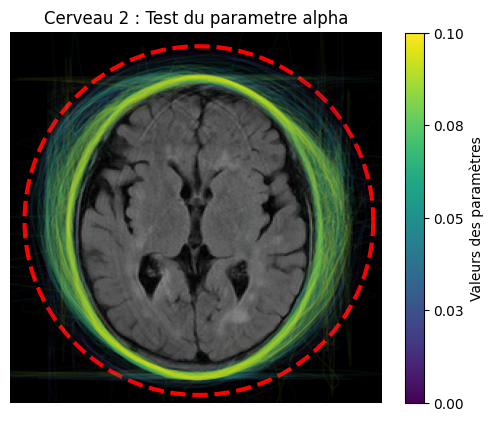

 99% (500 of 505) |##################### | Elapsed Time: 0:01:01 ETA:   0:00:00

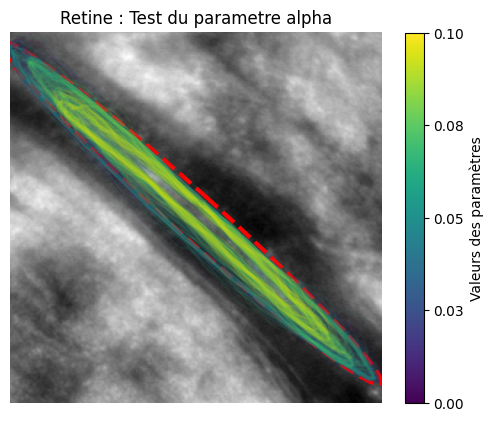

 98% (499 of 505) |##################### | Elapsed Time: 0:00:58 ETA:   0:00:00

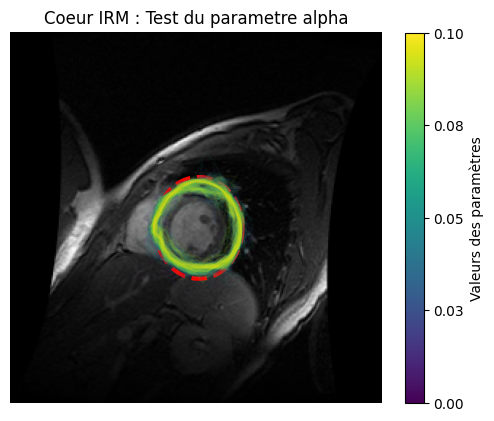

In [ ]:
params = ['periodic', 0.1, 2, 0, 10, 0.001]  # params = ['boundary_condition', 'alpha', 'beta', 'w_line', 'w_edge', 'gamma']

alpha=list(np.linspace(0.001,0.1,250))
alpha+=list(np.linspace(0.005,0.1,250))

params[1] = alpha

im = images[3]; imname = imagesnames[3]
s = np.linspace(0, 2*np.pi, 100)
r = 130 + 120*np.sin(s)
c = 130 + 120*np.cos(s)
init = np.array([r, c]).T
sac(im, imname, init, params, 'alpha')

im = images[1]; imname = imagesnames[1]
s = np.linspace(0, 2*np.pi, 100)
r = 175 * np.sin(s)
c = 15 * np.cos(s)
theta = np.radians(48)
rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)],
                            [np.sin(theta),  np.cos(theta)]])
ellipse_points = np.vstack((r, c)).T
rotated_ellipse_points = ellipse_points @ rotation_matrix.T
r_rotated = rotated_ellipse_points[:, 0] + 125
c_rotated = rotated_ellipse_points[:, 1] + 125
init = np.array([r_rotated, c_rotated]).T
sac(im, imname, init, params, 'alpha')

im = images[0]; imname = imagesnames[0]
r = 135 + 35 * np.sin(s)
c = 130 + 30 * np.cos(s)
init = np.array([r, c]).T
sac(im, imname, init, params, 'alpha')

###Tests sur le paramètre : beta

 99% (500 of 505) |##################### | Elapsed Time: 0:00:56 ETA:   0:00:00

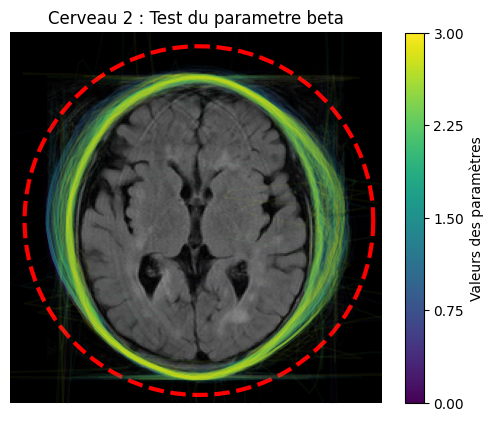

 99% (500 of 505) |##################### | Elapsed Time: 0:00:49 ETA:   0:00:00

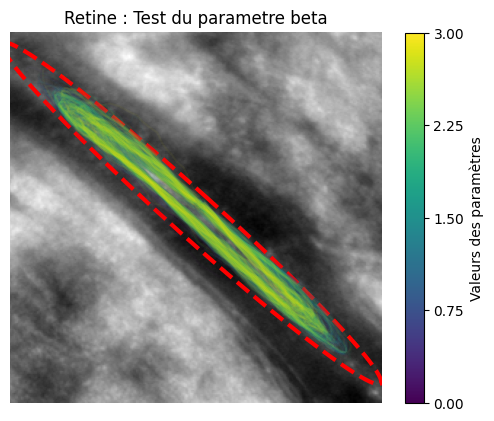

 98% (499 of 505) |##################### | Elapsed Time: 0:00:45 ETA:   0:00:00

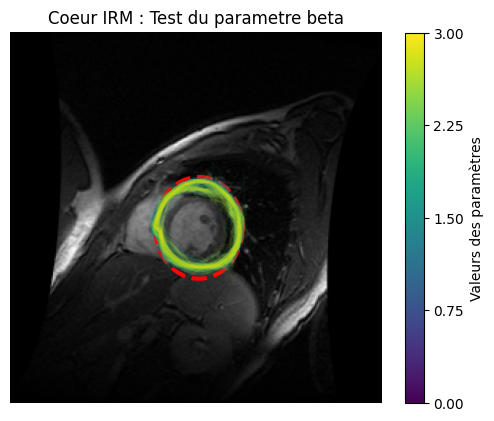

In [ ]:
params = ['periodic', 0.1, 2, 0, 10, 0.001]  # params = ['boundary_condition', 'alpha', 'beta', 'w_line', 'w_edge', 'gamma']

beta=list(np.linspace(0.001,1,250))
beta+=list(np.linspace(1,3,250))

params[2] = beta

im = images[3]; imname = imagesnames[3]
s = np.linspace(0, 2*np.pi, 100)
r = 130 + 120*np.sin(s)
c = 130 + 120*np.cos(s)
init = np.array([r, c]).T
sac(im, imname, init, params, 'beta')

im = images[1]; imname = imagesnames[1]
s = np.linspace(0, 2*np.pi, 100)
r = 175 * np.sin(s)
c = 15 * np.cos(s)
theta = np.radians(48)
rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)],
                            [np.sin(theta),  np.cos(theta)]])
ellipse_points = np.vstack((r, c)).T
rotated_ellipse_points = ellipse_points @ rotation_matrix.T
r_rotated = rotated_ellipse_points[:, 0] + 125
c_rotated = rotated_ellipse_points[:, 1] + 125
init = np.array([r_rotated, c_rotated]).T
sac(im, imname, init, params, 'beta')

im = images[0]; imname = imagesnames[0]
r = 135 + 35 * np.sin(s)
c = 130 + 30 * np.cos(s)
init = np.array([r, c]).T
sac(im, imname, init, params, 'beta')

###Tests sur le paramètre : w_line

 99% (500 of 505) |##################### | Elapsed Time: 0:01:10 ETA:   0:00:00

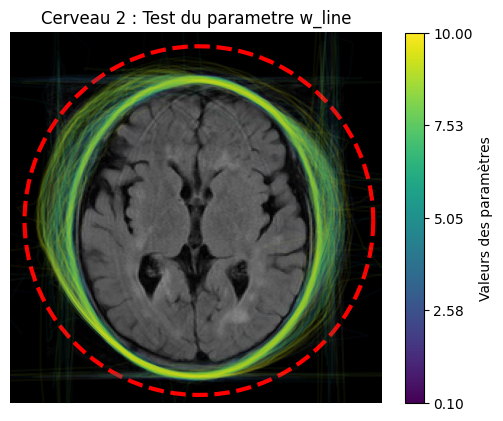

 98% (499 of 505) |##################### | Elapsed Time: 0:00:55 ETA:   0:00:00

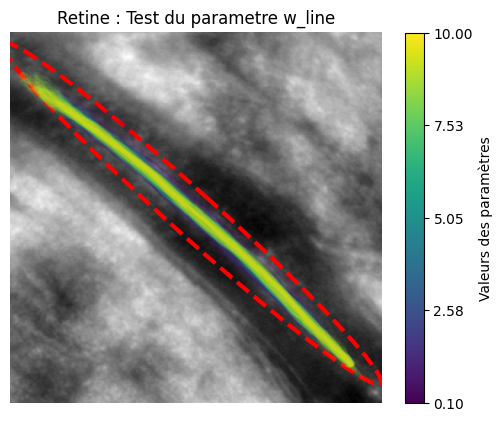

 98% (499 of 505) |##################### | Elapsed Time: 0:00:31 ETA:   0:00:00

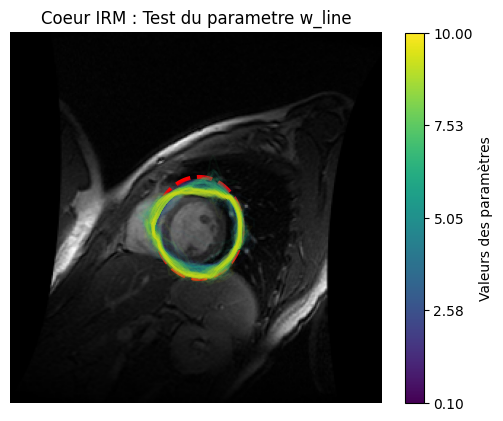

In [ ]:
params = ['periodic', 0.1, 2, 0, 10, 0.001]  # params = ['boundary_condition', 'alpha', 'beta', 'w_line', 'w_edge', 'gamma']

w_line=list(np.linspace(0.1,10,500))

params[3] = w_line

im = images[3]; imname = imagesnames[3]
s = np.linspace(0, 2*np.pi, 100)
r = 130 + 120*np.sin(s)
c = 130 + 120*np.cos(s)
init = np.array([r, c]).T
sac(im, imname, init, params, 'w_line')

im = images[1]; imname = imagesnames[1]
s = np.linspace(0, 2*np.pi, 100)
r = 175 * np.sin(s)
c = 15 * np.cos(s)
theta = np.radians(48)
rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)],
                            [np.sin(theta),  np.cos(theta)]])
ellipse_points = np.vstack((r, c)).T
rotated_ellipse_points = ellipse_points @ rotation_matrix.T
r_rotated = rotated_ellipse_points[:, 0] + 125
c_rotated = rotated_ellipse_points[:, 1] + 125
init = np.array([r_rotated, c_rotated]).T
sac(im, imname, init, params, 'w_line')

im = images[0]; imname = imagesnames[0]
r = 135 + 35 * np.sin(s)
c = 130 + 30 * np.cos(s)
init = np.array([r, c]).T
sac(im, imname, init, params, 'w_line')

###Tests sur le paramètre : w_edge

 99% (500 of 505) |##################### | Elapsed Time: 0:01:42 ETA:   0:00:01

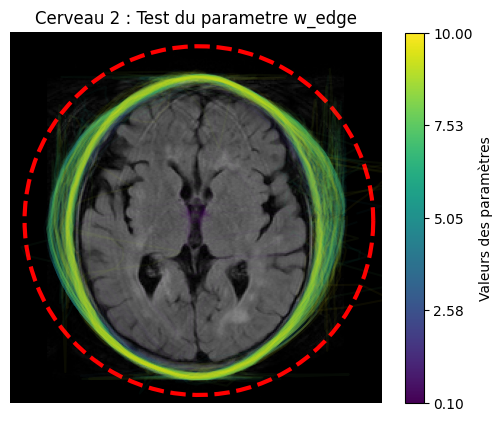

 98% (499 of 505) |##################### | Elapsed Time: 0:01:09 ETA:   0:00:00

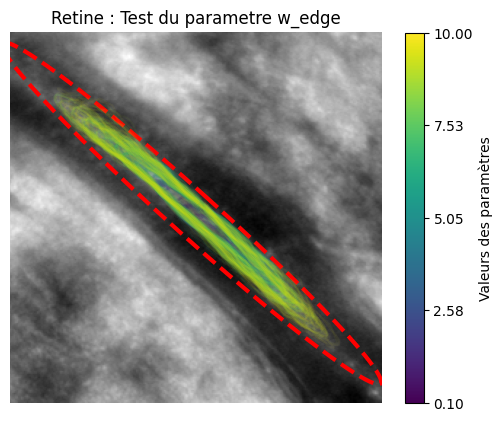

 98% (499 of 505) |##################### | Elapsed Time: 0:00:42 ETA:   0:00:00

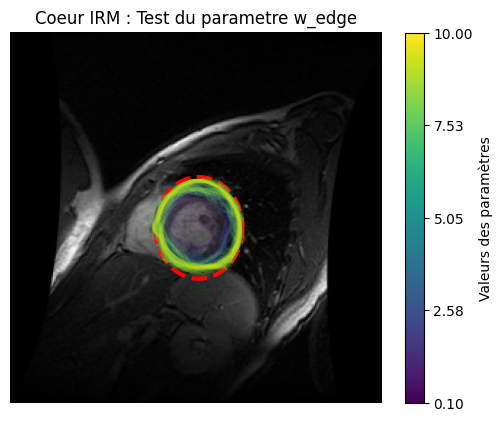

In [ ]:
params = ['periodic', 0.1, 2, 0, 10, 0.001]  # params = ['boundary_condition', 'alpha', 'beta', 'w_line', 'w_edge', 'gamma']

w_edge=list(np.linspace(0.1,10,500))

params[4] = w_edge

im = images[3]; imname = imagesnames[3]
s = np.linspace(0, 2*np.pi, 100)
r = 130 + 120*np.sin(s)
c = 130 + 120*np.cos(s)
init = np.array([r, c]).T
sac(im, imname, init, params, 'w_edge')

im = images[1]; imname = imagesnames[1]
s = np.linspace(0, 2*np.pi, 100)
r = 175 * np.sin(s)
c = 15 * np.cos(s)
theta = np.radians(48)
rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)],
                            [np.sin(theta),  np.cos(theta)]])
ellipse_points = np.vstack((r, c)).T
rotated_ellipse_points = ellipse_points @ rotation_matrix.T
r_rotated = rotated_ellipse_points[:, 0] + 125
c_rotated = rotated_ellipse_points[:, 1] + 125
init = np.array([r_rotated, c_rotated]).T
sac(im, imname, init, params, 'w_edge')

im = images[0]; imname = imagesnames[0]
r = 135 + 35 * np.sin(s)
c = 130 + 30 * np.cos(s)
init = np.array([r, c]).T
sac(im, imname, init, params, 'w_edge')

###Tests sur le paramètre : gamma

 98% (499 of 505) |##################### | Elapsed Time: 0:02:01 ETA:   0:00:01

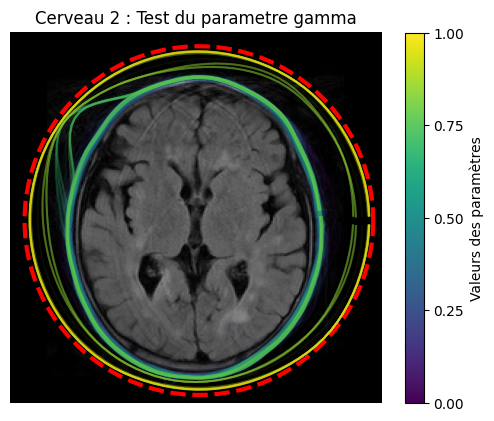

 99% (500 of 505) |##################### | Elapsed Time: 0:03:13 ETA:   0:00:01

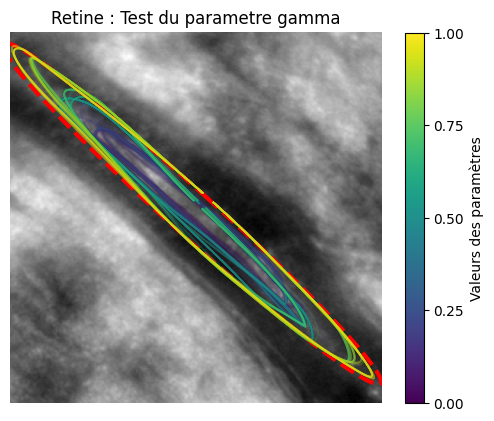

 98% (499 of 505) |##################### | Elapsed Time: 0:07:05 ETA:   0:00:05

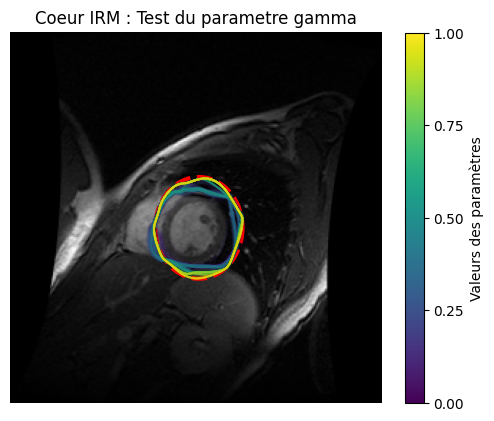

In [ ]:
params = ['periodic', 0.1, 2, 0, 10, 0.001]  # params = ['boundary_condition', 'alpha', 'beta', 'w_line', 'w_edge', 'gamma']

gamma=list(np.linspace(0.001,0.1,250))
gamma+=list(np.linspace(0.001,1,250))

params[5] = gamma

im = images[3]; imname = imagesnames[3]
s = np.linspace(0, 2*np.pi, 100)
r = 130 + 120*np.sin(s)
c = 130 + 120*np.cos(s)
init = np.array([r, c]).T
sac(im, imname, init, params, 'gamma')

im = images[1]; imname = imagesnames[1]
s = np.linspace(0, 2*np.pi, 100)
r = 175 * np.sin(s)
c = 15 * np.cos(s)
theta = np.radians(48)
rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)],
                            [np.sin(theta),  np.cos(theta)]])
ellipse_points = np.vstack((r, c)).T
rotated_ellipse_points = ellipse_points @ rotation_matrix.T
r_rotated = rotated_ellipse_points[:, 0] + 125
c_rotated = rotated_ellipse_points[:, 1] + 125
init = np.array([r_rotated, c_rotated]).T
sac(im, imname, init, params, 'gamma')

im = images[0]; imname = imagesnames[0]
r = 135 + 35 * np.sin(s)
c = 130 + 30 * np.cos(s)
init = np.array([r, c]).T
sac(im, imname, init, params, 'gamma')

###Tests sur le paramètre : boundary_condition

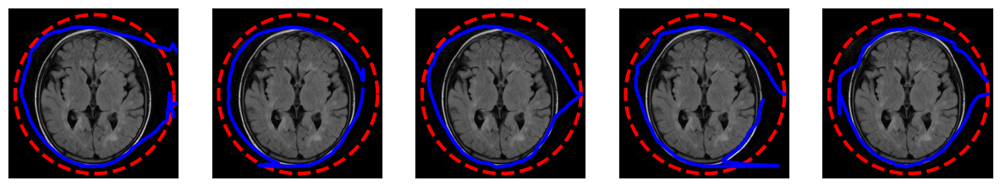

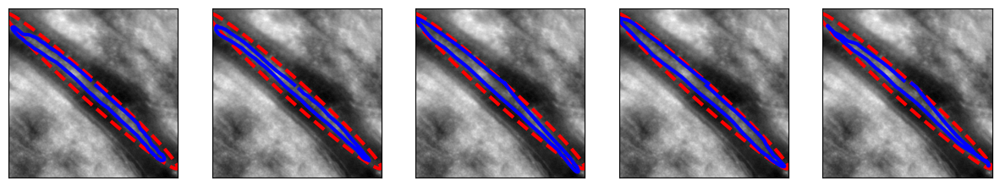

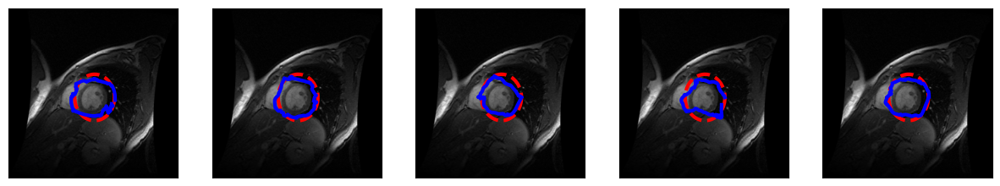

In [ ]:
def b_sac(im, imname, init, paramsb):  # paramsb = boundary_conditions

  axes = (plt.figure(figsize=(15,15),constrained_layout=False)
       .subplots(1, 5, sharex=False, sharey=False))
  for i in range(len(paramsb)):
    snake = active_contour(gaussian(im, 1), init, boundary_condition=paramsb[i],
                       alpha=0.01, beta=2, w_line=0, w_edge=10, gamma=0.001)

    axes[i].imshow(im, cmap=plt.cm.gray)
    axes[i].plot(init[:, 1], init[:, 0], '--r', lw=3)
    axes[i].plot(snake[:, 1], snake[:, 0], '-b', lw=3)
    axes[i].set_xticks([]), axes[i].set_yticks([])
    axes[i].axis([0, im.shape[1], im.shape[0], 0])

  plt.show()

boundary = ['free', 'periodic', 'fixed', 'free-fixed', 'fixed-free']

im = images[3]; imname = imagesnames[3]
s = np.linspace(0, 2*np.pi, 100)
r = 130 + 120*np.sin(s)
c = 130 + 120*np.cos(s)
init = np.array([r, c]).T
b_sac(im, imname, init, boundary)

im = images[1]; imname = imagesnames[1]
s = np.linspace(0, 2*np.pi, 100)
r = 175 * np.sin(s)
c = 15 * np.cos(s)
theta = np.radians(48)
rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)],
                            [np.sin(theta),  np.cos(theta)]])
ellipse_points = np.vstack((r, c)).T
rotated_ellipse_points = ellipse_points @ rotation_matrix.T
r_rotated = rotated_ellipse_points[:, 0] + 125
c_rotated = rotated_ellipse_points[:, 1] + 125
init = np.array([r_rotated, c_rotated]).T
b_sac(im, imname, init, boundary)

im = images[0]; imname = imagesnames[0]
r = 135 + 35 * np.sin(s)
c = 130 + 30 * np.cos(s)
init = np.array([r, c]).T
b_sac(im, imname, init, boundary)

###Chan-vese

In [ ]:
# Init avec x cercles
def multiplecircle(im, circleNum):
  circleRadius = im.shape[0] / (3*circleNum)
  circleStep0 = im.shape[0]/(circleNum+1)
  circleStep1 = im.shape[1]/(circleNum+1)
  init_ls = np.zeros(im.shape)
  for i in range(circleNum):
          for j in range(circleNum):
              center_f= ((i+1)*circleStep0, (j+1)*circleStep1)

              init_ls = init_ls + disk_level_set (im.shape,center=center_f,radius=circleRadius)
  return init_ls

def scv(img, params, paramname): # params = ['mu', 'lambda1', 'lambda2', 'tol', 'max_num_iter', 'dt', 'init']
  paramscopy = params.copy()

  total_iters = sum(len(p) if isinstance(p, list) else 0 for p in params)
  bar = progressbar.ProgressBar(max_value=total_iters)

  ite = 0
  for i in params:
    if isinstance(i, list):
      fig, axs = plt.subplots(2, len(i), sharex=False, sharey=False, figsize=(15, 20), constrained_layout=False)

      for j in range(len(i)):
        paramscopy[ite] = i[j]

        cv = chan_vese(img, mu=paramscopy[0], lambda1=paramscopy[1], lambda2=paramscopy[2], tol=paramscopy[3],
                        max_num_iter=paramscopy[4],
                        dt=paramscopy[5], init_level_set=paramscopy[6], extended_output=True)

        axs[0, j].imshow(cv[0], cmap="gray")
        axs[0, j].set_title("Chan-Vese segmentation\n"+paramname + " = {:.2f}".format(paramscopy[ite]))
        axs[1, j].imshow(cv[1], cmap="gray")
        axs[1, j].set_title("Final Level Set\n"+paramname + " = {:.2f}".format(paramscopy[ite]))
        bar.update(bar.value + 1)
    ite += 1

  plt.subplots_adjust(top= 0.4)
  plt.show()

100% (5 of 5) |##########################| Elapsed Time: 0:00:11 ETA:  00:00:00

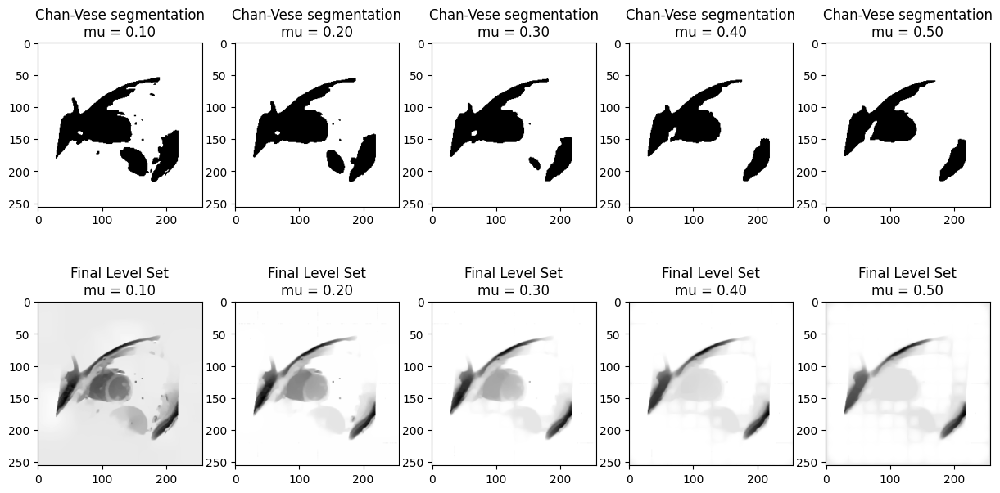

100% (5 of 5) |##########################| Elapsed Time: 0:00:09 ETA:  00:00:00

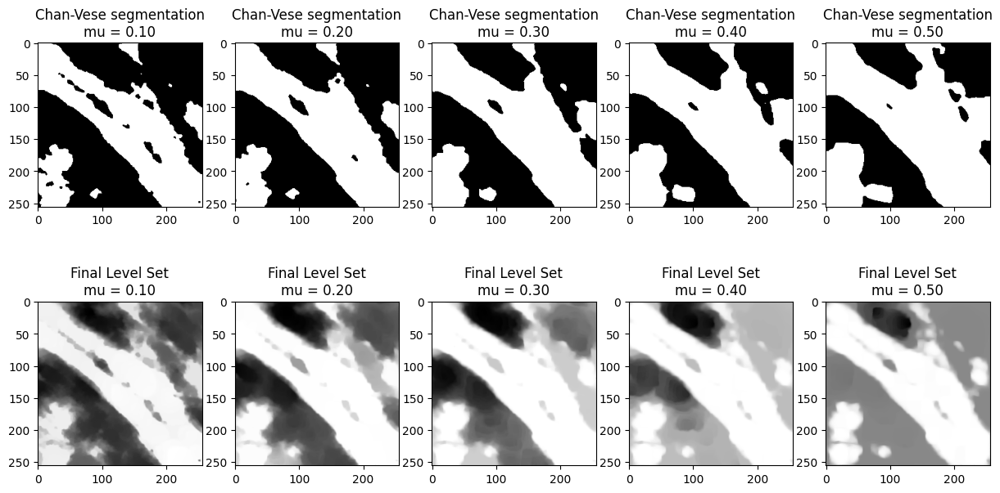

100% (5 of 5) |##########################| Elapsed Time: 0:00:24 ETA:  00:00:00

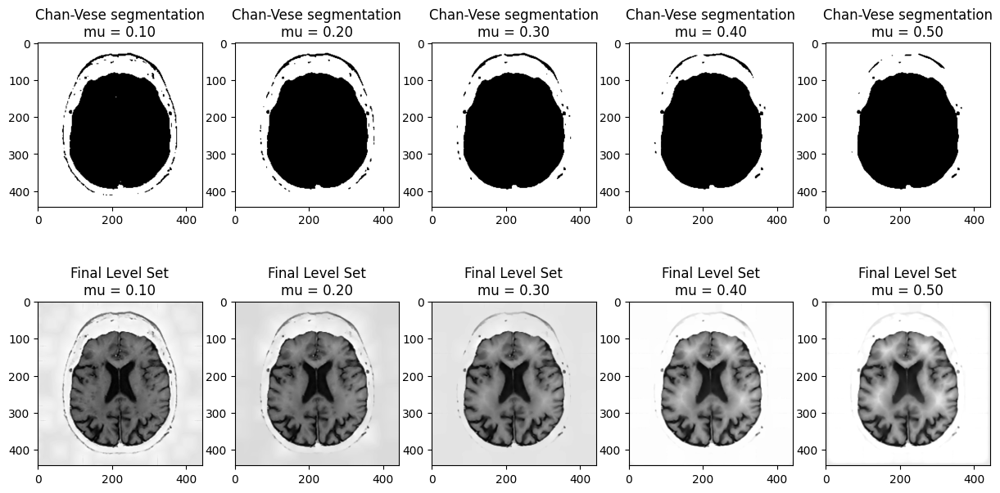

100% (5 of 5) |##########################| Elapsed Time: 0:00:06 ETA:  00:00:00

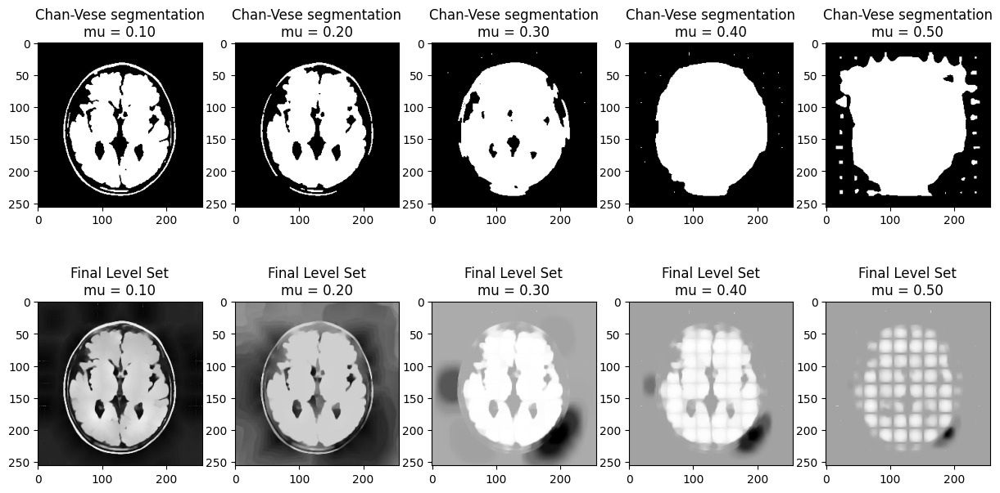

In [ ]:
params = [0.25, 5, 2, 0.001, 200, 0.5] # params = ['mu', 'lambda1', 'lambda2', 'tol', 'max_num_iter', 'dt']

mu = list(np.linspace(0.1, 0.5, 5))
params[0] = mu

im = images[0]
scv(im, params, 'mu', init=multiplecircle(im, 10))

im = images[1]
scv(im, params, 'mu', init=multiplecircle(im, 10))

im = images[2]
scv(im, params, 'mu', init=multiplecircle(im, 10))

im = images[3]
scv(im, params, 'mu', init=multiplecircle(im, 10))

100% (5 of 5) |##########################| Elapsed Time: 0:00:07 ETA:  00:00:00

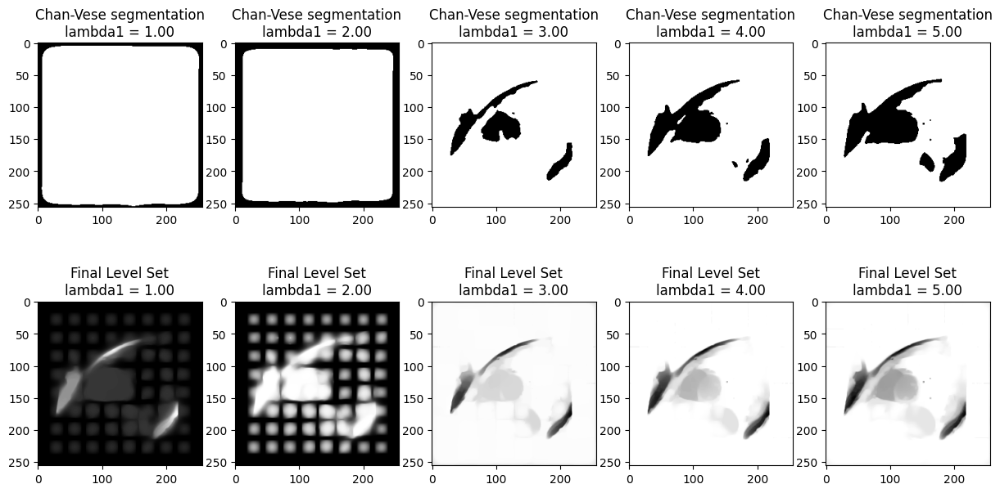

100% (5 of 5) |##########################| Elapsed Time: 0:00:07 ETA:  00:00:00

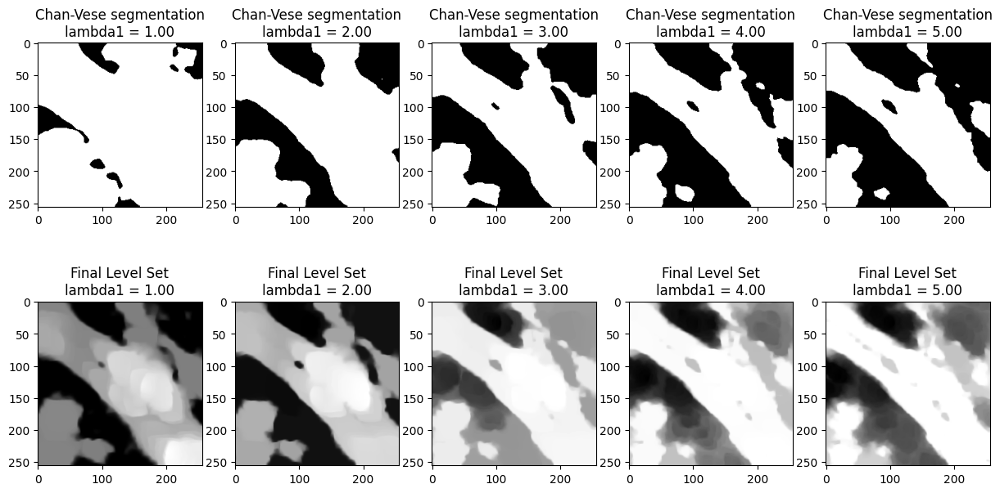

100% (5 of 5) |##########################| Elapsed Time: 0:00:29 ETA:  00:00:00

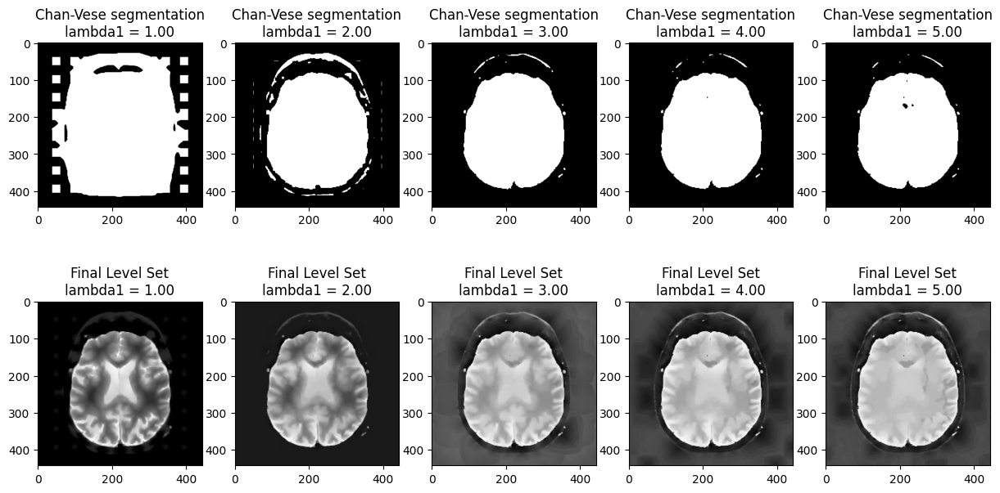

100% (5 of 5) |##########################| Elapsed Time: 0:00:08 ETA:  00:00:00

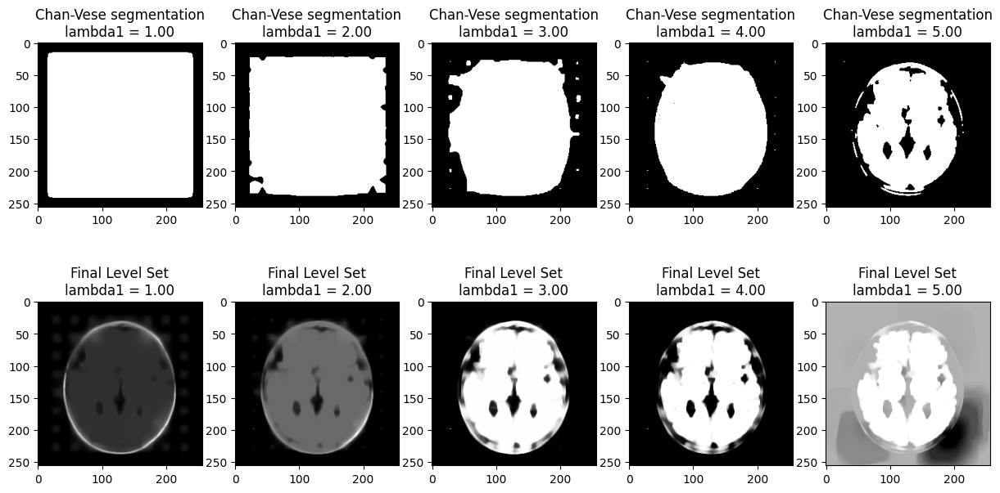

In [ ]:
params = [0.25, 5, 2, 0.001, 200, 0.5] # params = ['mu', 'lambda1', 'lambda2', 'tol', 'max_num_iter', 'dt']

lambda1 = list(np.linspace(1, 5, 5))
params[1] = lambda1

im = images[0]
scv(im, params, 'lambda1', init=multiplecircle(im, 8))

im = images[1]
scv(im, params, 'lambda1', init=multiplecircle(im, 8))

im = images[2]
scv(im, params, 'lambda1', init=multiplecircle(im, 8))

im = images[3]
scv(im, params, 'lambda1', init=multiplecircle(im, 8))

100% (5 of 5) |##########################| Elapsed Time: 0:00:07 ETA:  00:00:00

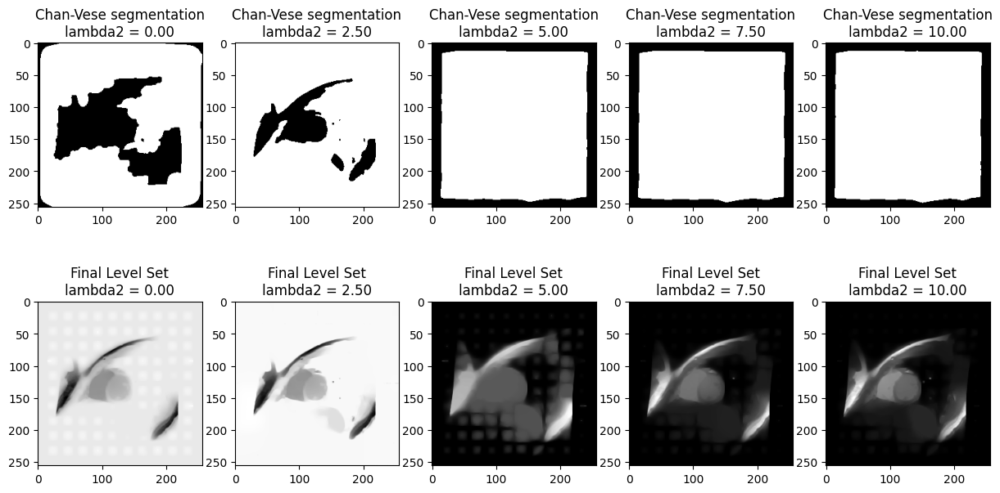

100% (5 of 5) |##########################| Elapsed Time: 0:00:07 ETA:  00:00:00

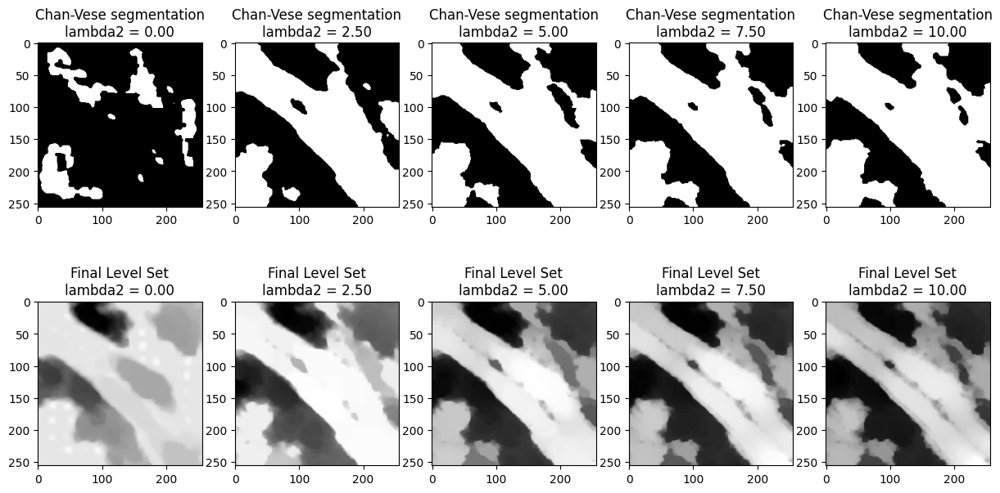

100% (5 of 5) |##########################| Elapsed Time: 0:00:23 ETA:  00:00:00

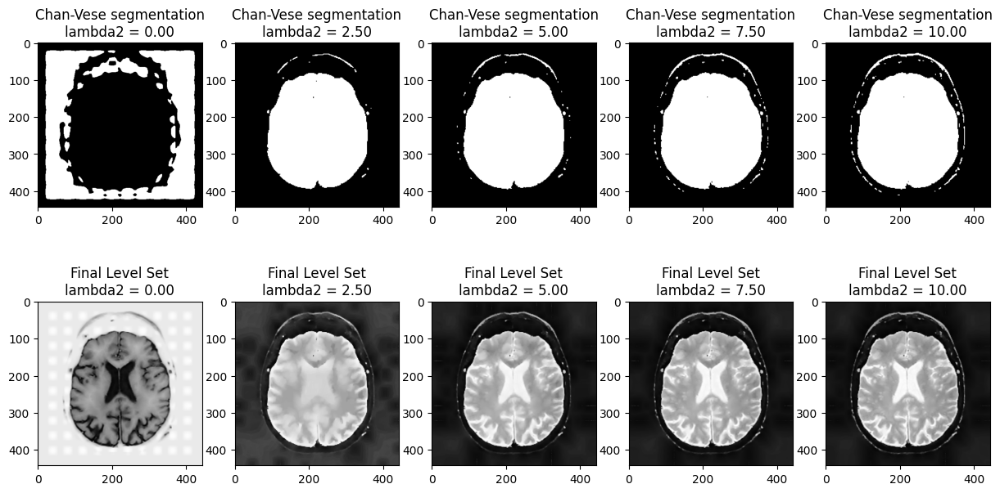

100% (5 of 5) |##########################| Elapsed Time: 0:00:07 ETA:  00:00:00

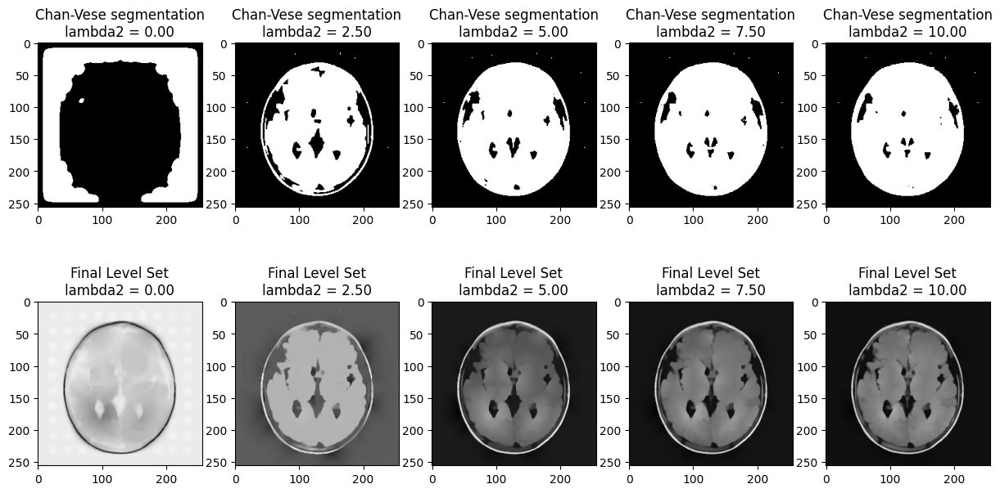

In [ ]:
params = [0.25, 5, 2, 0.001, 200, 0.5] # params = ['mu', 'lambda1', 'lambda2', 'tol', 'max_num_iter', 'dt']

lambda2 = list(np.linspace(0, 10, 5))
params[2] = lambda2

im = images[0]
scv(im, params, 'lambda2', init=multiplecircle(im, 10))

im = images[1]
scv(im, params, 'lambda2', init=multiplecircle(im, 10))

im = images[2]
scv(im, params, 'lambda2', init=multiplecircle(im, 10))

im = images[3]
scv(im, params, 'lambda2', init=multiplecircle(im, 10))

100% (5 of 5) |##########################| Elapsed Time: 0:00:05 ETA:  00:00:00

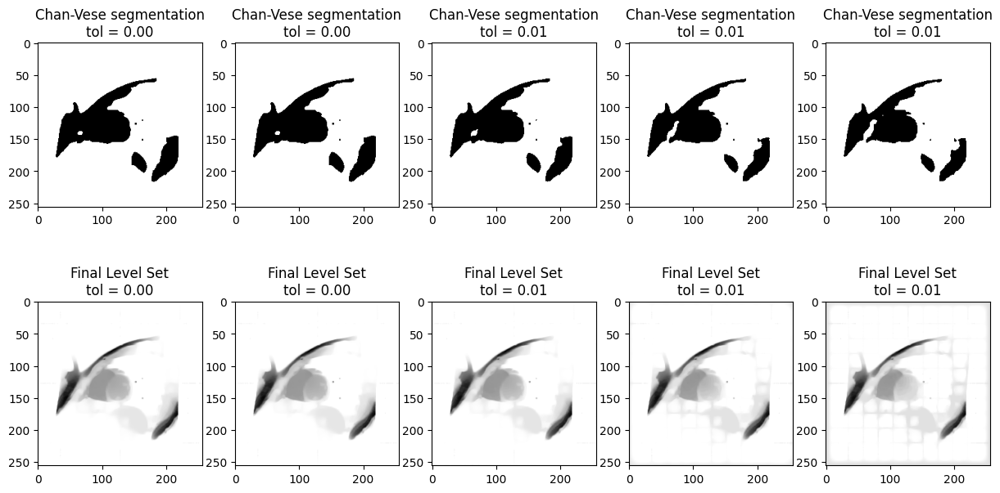

100% (5 of 5) |##########################| Elapsed Time: 0:00:06 ETA:  00:00:00

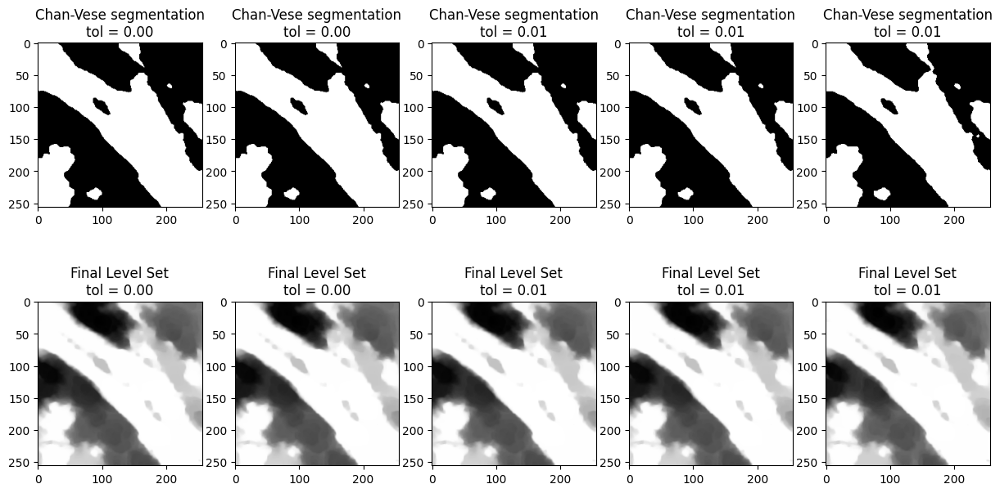

100% (5 of 5) |##########################| Elapsed Time: 0:00:23 ETA:  00:00:00

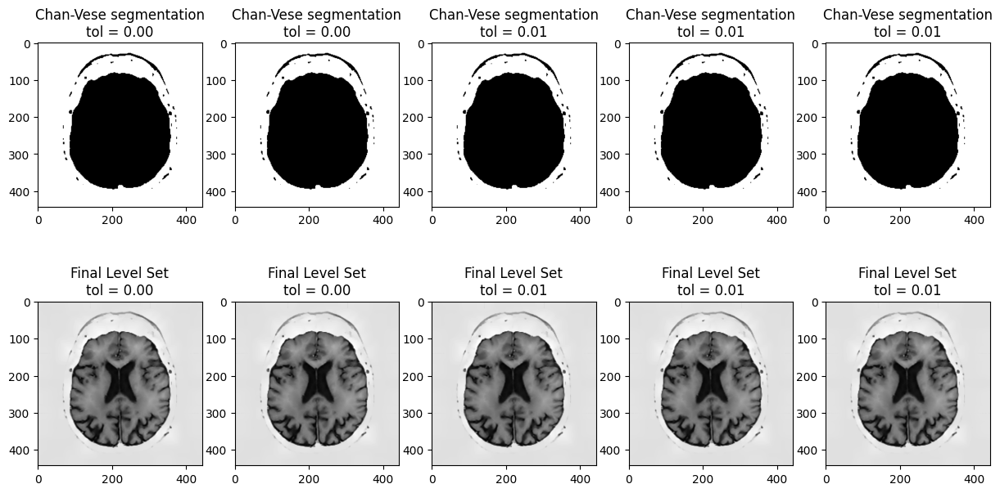

100% (5 of 5) |##########################| Elapsed Time: 0:00:04 ETA:  00:00:00

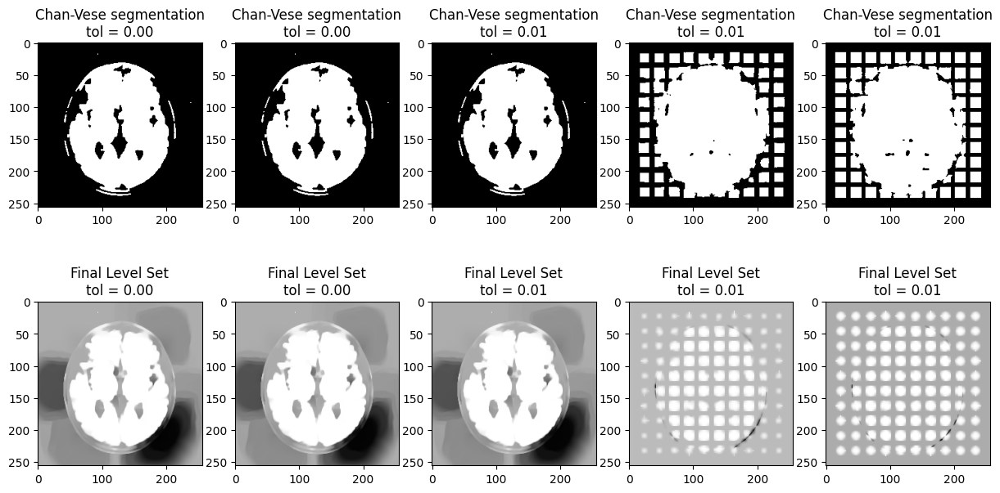

In [ ]:
params = [0.25, 5, 2, 0.001, 200, 0.5] # params = ['mu', 'lambda1', 'lambda2', 'tol', 'max_num_iter', 'dt']

tol = list(np.linspace(0.0001, 0.01, 5))
params[3] = tol

im = images[0]
scv(im, params, 'tol', init=multiplecircle(im, 10))

im = images[1]
scv(im, params, 'tol', init=multiplecircle(im, 10))

im = images[2]
scv(im, params, 'tol', init=multiplecircle(im, 10))

im = images[3]
scv(im, params, 'tol', init=multiplecircle(im, 10))

100% (5 of 5) |##########################| Elapsed Time: 0:00:12 ETA:  00:00:00

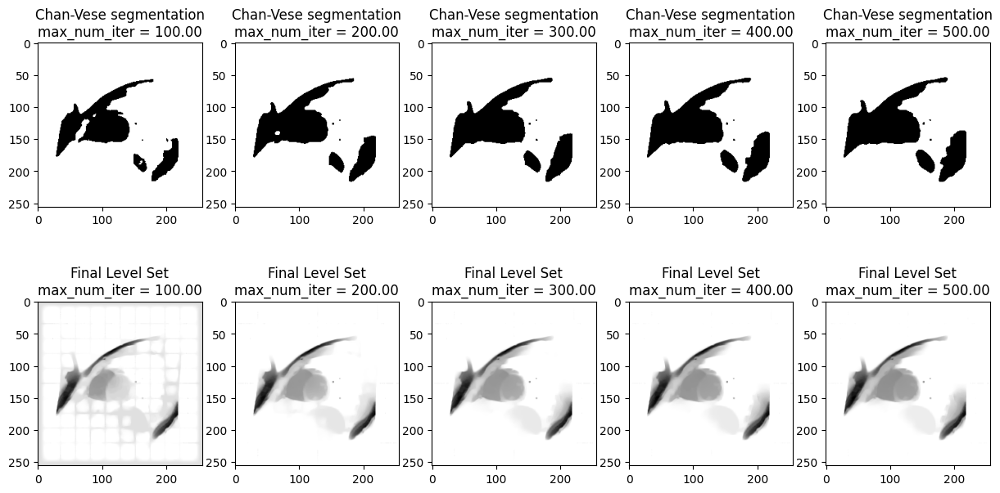

100% (5 of 5) |##########################| Elapsed Time: 0:00:13 ETA:  00:00:00

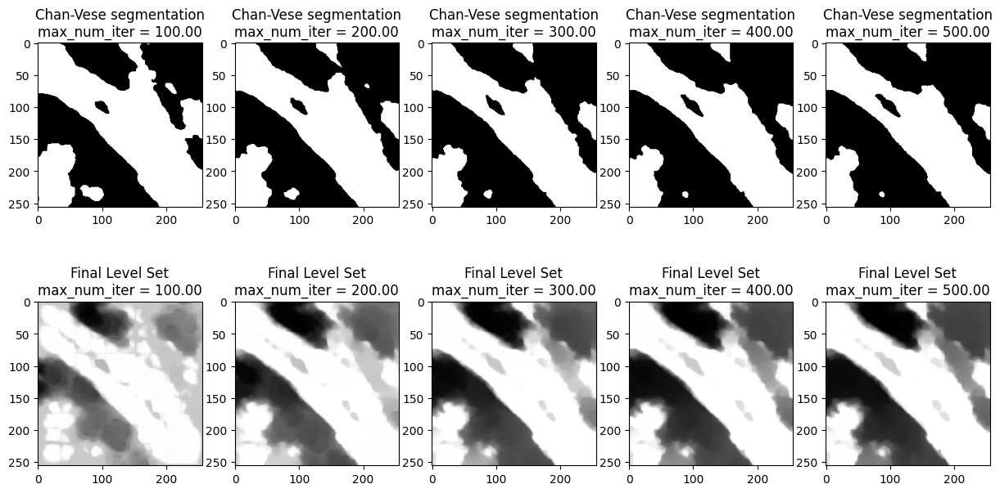

100% (5 of 5) |##########################| Elapsed Time: 0:00:40 ETA:  00:00:00

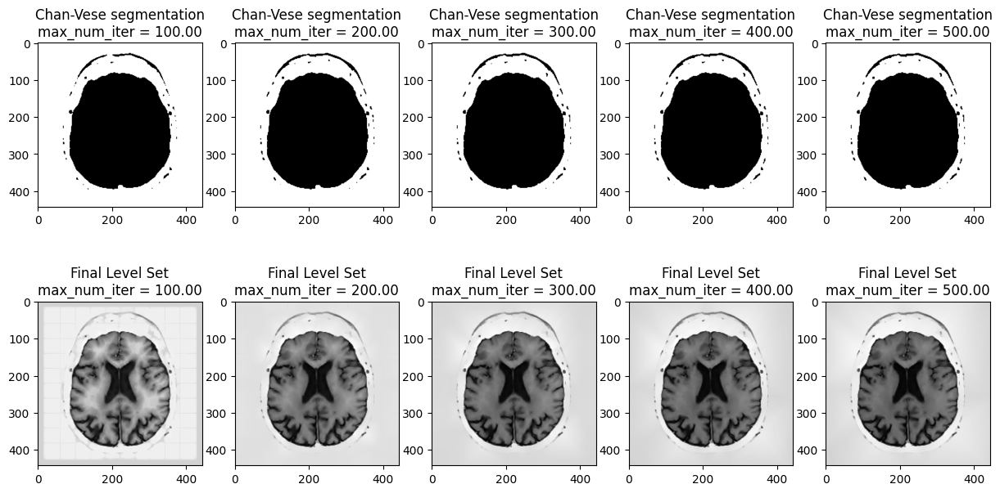

100% (5 of 5) |##########################| Elapsed Time: 0:00:13 ETA:  00:00:00

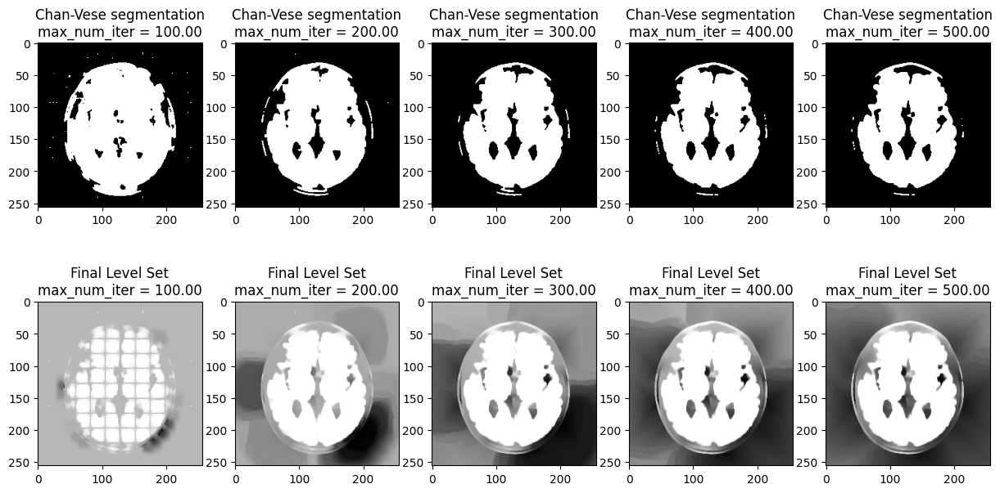

In [ ]:
params = [0.25, 5, 2, 0.001, 200, 0.5] # params = ['mu', 'lambda1', 'lambda2', 'tol', 'max_num_iter', 'dt']

max_num_iter = list(np.linspace(100, 500, 5))
params[4] = max_num_iter

im = images[0]
scv(im, params, 'max_num_iter', init=multiplecircle(im, 10))

im = images[1]
scv(im, params, 'max_num_iter', init=multiplecircle(im, 10))

im = images[2]
scv(im, params, 'max_num_iter', init=multiplecircle(im, 10))

im = images[3]
scv(im, params, 'max_num_iter', init=multiplecircle(im, 10))

100% (5 of 5) |##########################| Elapsed Time: 0:00:07 ETA:  00:00:00

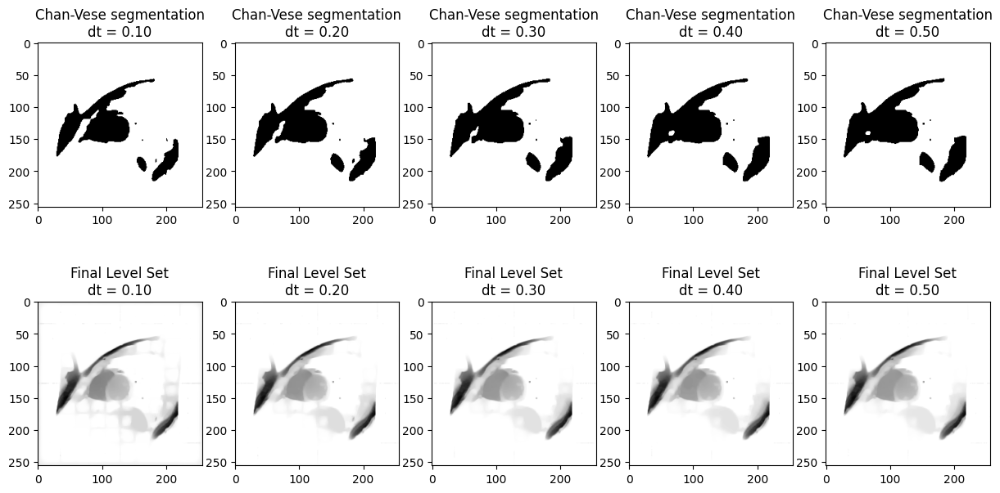

100% (5 of 5) |##########################| Elapsed Time: 0:00:07 ETA:  00:00:00

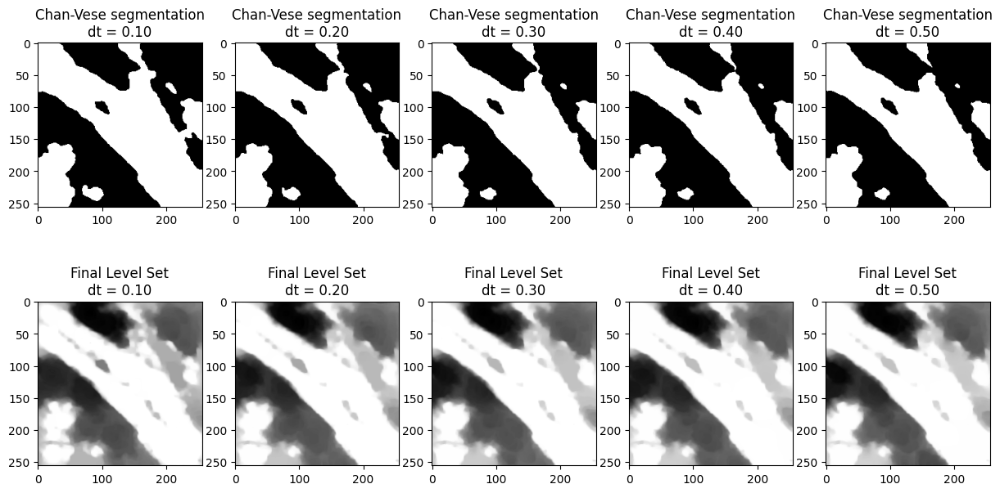

100% (5 of 5) |##########################| Elapsed Time: 0:00:23 ETA:  00:00:00

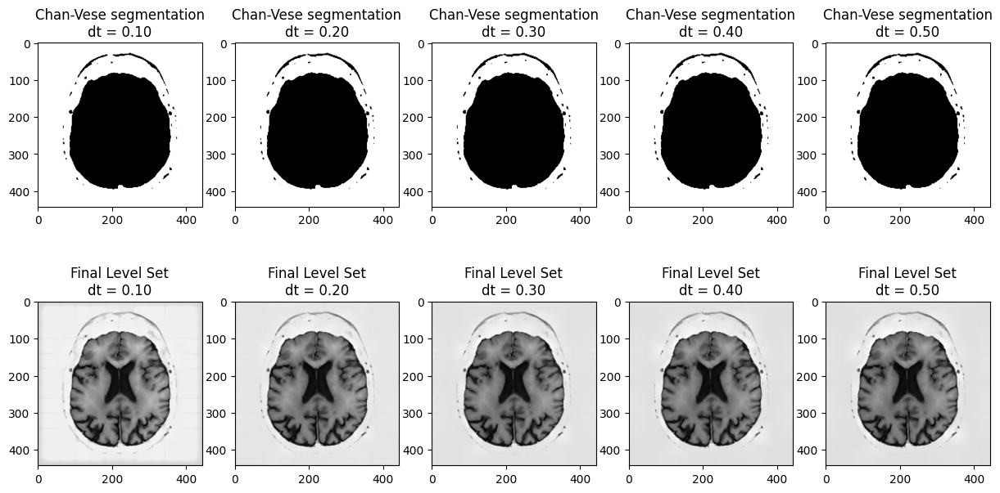

100% (5 of 5) |##########################| Elapsed Time: 0:00:07 ETA:  00:00:00

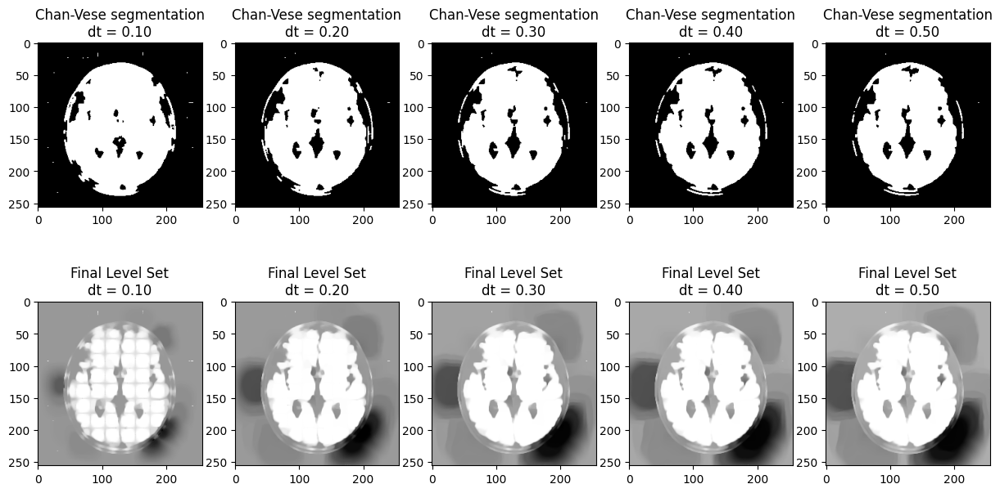

In [ ]:
params = [0.25, 5, 2, 0.001, 200, 0.5] # params = ['mu', 'lambda1', 'lambda2', 'tol', 'max_num_iter', 'dt']

dt = list(np.linspace(0.1, 0.5, 5))
params[5] = dt

im = images[0]
scv(im, params, 'dt', init=multiplecircle(im, 10))

im = images[1]
scv(im, params, 'dt', init=multiplecircle(im, 10))

im = images[2]
scv(im, params, 'dt', init=multiplecircle(im, 10))

im = images[3]
scv(im, params, 'dt', init=multiplecircle(im, 10))

In [ ]:
def tests_init(im, params):
  init = [multiplecircle(im, 10), 'checkerboard', 'disk', 'small disk']
  paramname = ['10 multiple circles', 'checkerboard', 'disk', 'small disk']

  ite = 0
  fig, axs = plt.subplots(2, len(init), sharex=False, sharey=False, figsize=(15, 20), constrained_layout=False)
  for i in init:
    cv = chan_vese(im, mu=params[0], lambda1=params[1], lambda2=params[2], tol=params[3],
                        max_num_iter=params[4],
                        dt=params[5], init_level_set=i, extended_output=True)

    axs[0, ite].imshow(cv[0], cmap="gray")
    axs[0, ite].set_title("Chan-Vese segmentation\n"+paramname[ite])
    axs[1, ite].imshow(cv[1], cmap="gray")
    axs[1, ite].set_title("Final Level Set\n"+paramname[ite])
    ite += 1

  plt.subplots_adjust(top= 0.4)
  plt.show()

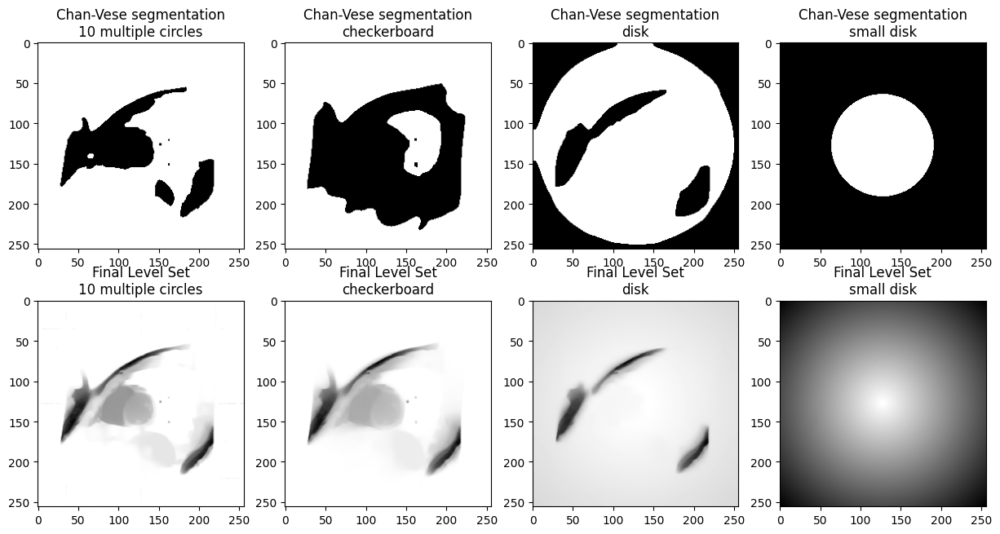

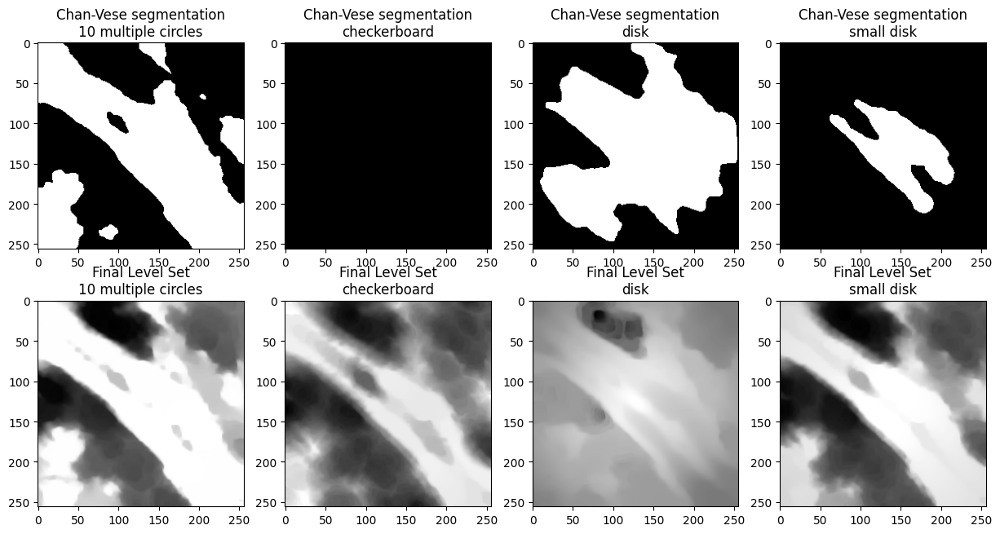

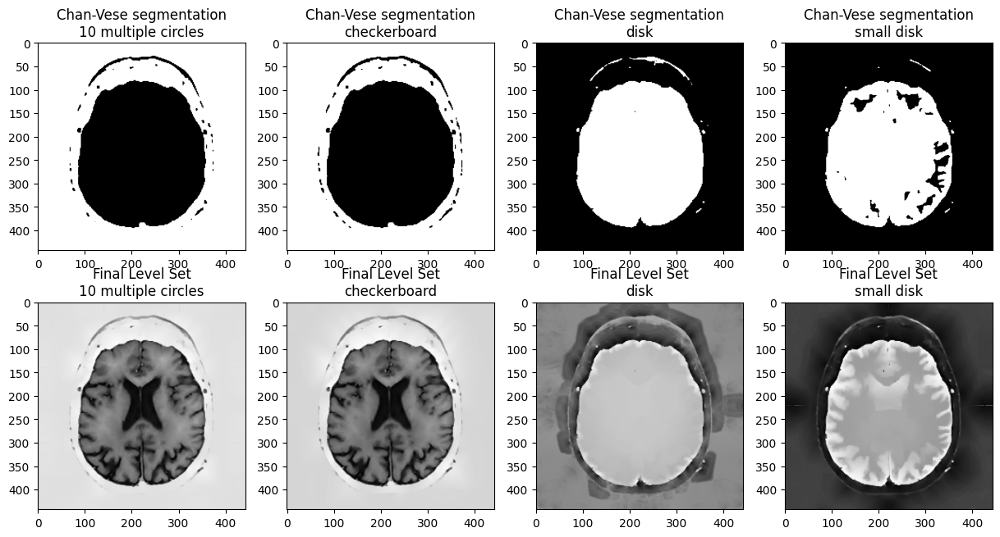

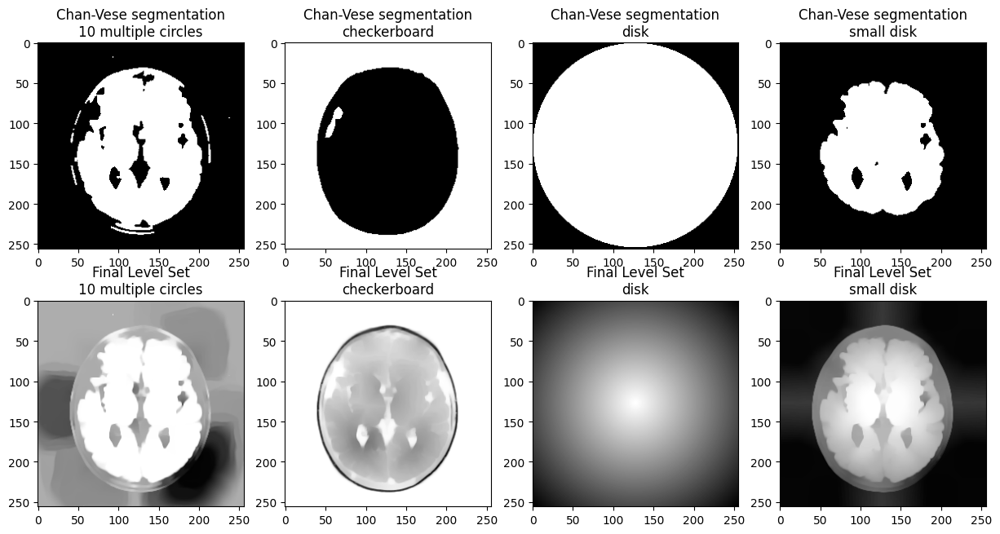

In [ ]:
params = [0.25, 5, 2, 0.001, 200, 0.5] # params = ['mu', 'lambda1', 'lambda2', 'tol', 'max_num_iter', 'dt']

im = images[0]
tests_init(im, params)

im = images[1]
tests_init(im, params)

im = images[2]
tests_init(im, params)

im = images[3]
tests_init(im, params)

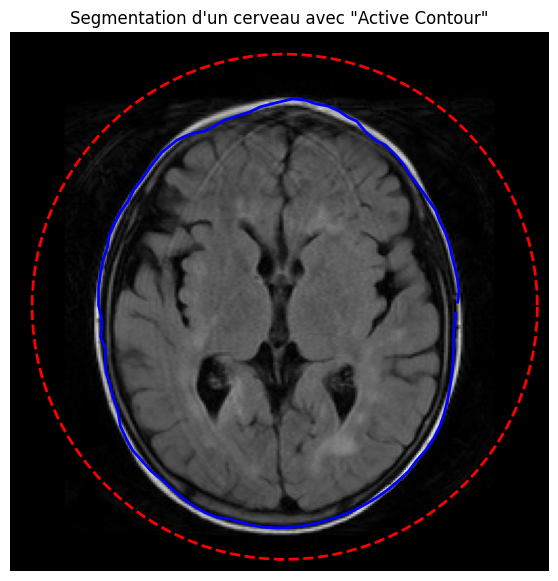

In [285]:
im = images[3]
s = np.linspace(0, 2*np.pi, 100)
r = 130 + 120*np.sin(s)
c = 130 + 120*np.cos(s)
init = np.array([r, c]).T

snake = active_contour(im, init, alpha=0.01, beta=1, w_line=0, w_edge=0.25, gamma=0.001)

fig, ax = plt.subplots(figsize=(7, 7))
ax.imshow(im, cmap=plt.cm.gray)
ax.plot(init[:, 1], init[:, 0], '--r', lw=2)
ax.plot(snake[:, 1], snake[:, 0], '-b', lw=2)
ax.set_title("Segmentation d\'un cerveau avec \"Active Contour\"")
ax.axis('off')

plt.show()

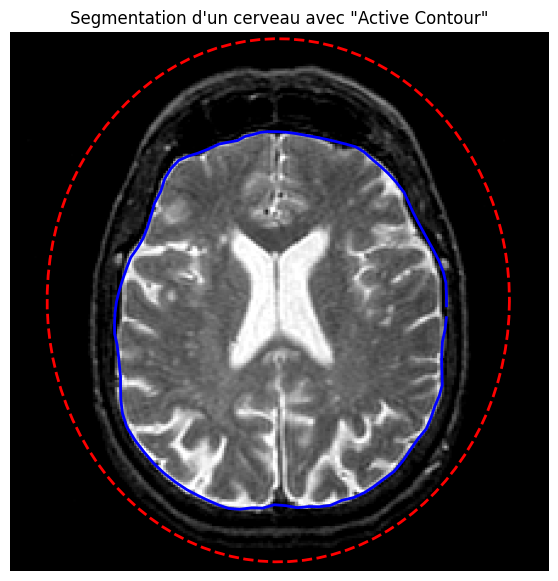

In [283]:
im = images[2]
s = np.linspace(0, 2*np.pi, 100)
r = 220 + 215*np.sin(s)
c = 220 + 190*np.cos(s)
init = np.array([r, c]).T

snake = active_contour(im, init, alpha=0.01, beta=0.01, w_line=0, w_edge=0.21, gamma=0.001)

fig, ax = plt.subplots(figsize=(7, 7))
ax.imshow(im, cmap=plt.cm.gray)
ax.plot(init[:, 1], init[:, 0], '--r', lw=2)
ax.plot(snake[:, 1], snake[:, 0], '-b', lw=2)
ax.set_title("Segmentation d\'un cerveau avec \"Active Contour\"")
ax.axis('off')

plt.show()

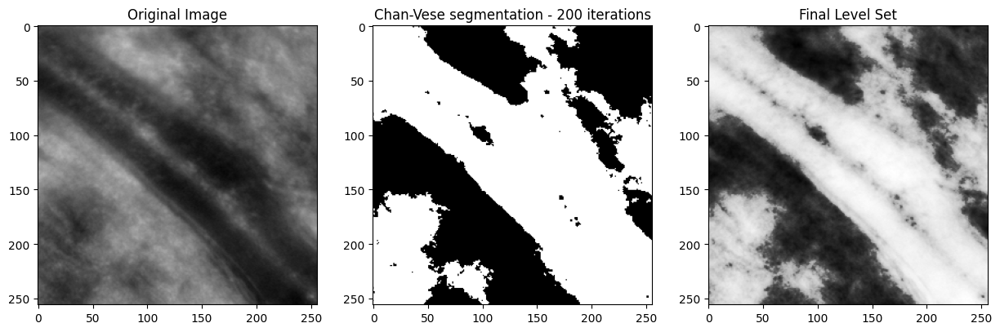

In [449]:
im = images[1]
circleNum = 10
circleRadius = im.shape[0] / (3*circleNum)
circleStep0 = im.shape[0]/(circleNum+1)
circleStep1 = im.shape[1]/(circleNum+1)
init_ls = np.zeros(im.shape)
for i in range(circleNum):
        for j in range(circleNum):
            center_f= ((i+1)*circleStep0, (j+1)*circleStep1)

            init_ls = init_ls + disk_level_set (im.shape,center=center_f,radius=circleRadius)


axs = (plt.figure(figsize=(15,20),constrained_layout=False)
       .subplots(1, 3, sharex=False, sharey=False))


cv = chan_vese(im, mu=0.0001, lambda1=1, lambda2=1, tol=1e-4, max_num_iter=200,
               dt=0.5, init_level_set=init_ls, extended_output=True)

axs[0].imshow(im, cmap='gray', vmin = 0, vmax = 255)
axs[0].set_title('Original Image')

axs[1].imshow(cv[0],cmap="gray")
t = "Chan-Vese segmentation - {} iterations".format(len(cv[2]))
axs[1].set_title(t)

axs[2].imshow(cv[1], cmap="gray")
axs[2].set_title("Final Level Set", fontsize=12)

plt.show()

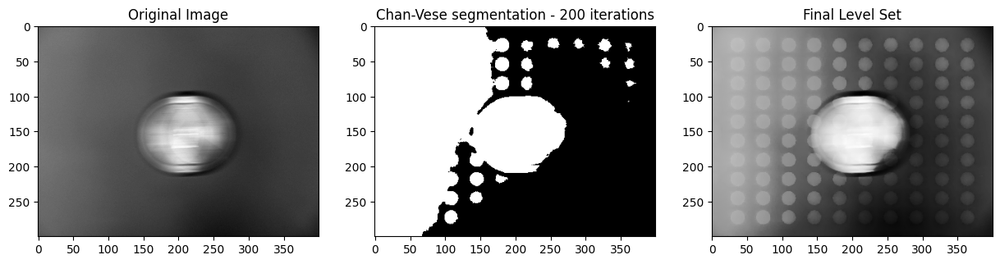

In [351]:
im = img_as_float(data.clock())
circleNum = 10
circleRadius = im.shape[0] / (3*circleNum)
circleStep0 = im.shape[0]/(circleNum+1)
circleStep1 = im.shape[1]/(circleNum+1)
init_ls = np.zeros(im.shape)
for i in range(circleNum):
        for j in range(circleNum):
            center_f= ((i+1)*circleStep0, (j+1)*circleStep1)

            init_ls = init_ls + disk_level_set (im.shape,center=center_f,radius=circleRadius)


axs = (plt.figure(figsize=(15,20),constrained_layout=False)
       .subplots(1, 3, sharex=False, sharey=False))


cv = chan_vese(im, mu=0.0025, lambda1=1, lambda2=1, tol=1e-4, max_num_iter=200,
               dt=0.5, init_level_set=init_ls, extended_output=True)

axs[0].imshow(im, cmap='gray')
axs[0].set_title('Original Image')

axs[1].imshow(cv[0],cmap="gray")
t = "Chan-Vese segmentation - {} iterations".format(len(cv[2]))
axs[1].set_title(t)

axs[2].imshow(cv[1], cmap="gray")
axs[2].set_title("Final Level Set", fontsize=12)

plt.show()

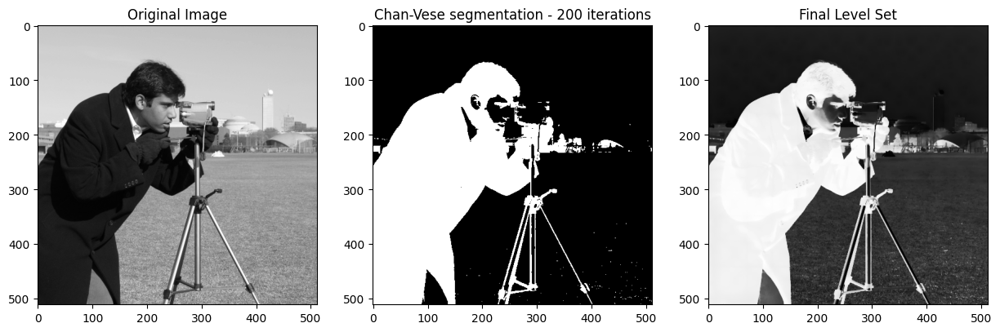

In [347]:
im = img_as_float(data.camera())
circleNum = 10
circleRadius = im.shape[0] / (3*circleNum)
circleStep0 = im.shape[0]/(circleNum+1)
circleStep1 = im.shape[1]/(circleNum+1)
init_ls = np.zeros(im.shape)
for i in range(circleNum):
        for j in range(circleNum):
            center_f= ((i+1)*circleStep0, (j+1)*circleStep1)

            init_ls = init_ls + disk_level_set (im.shape,center=center_f,radius=circleRadius)


axs = (plt.figure(figsize=(15,20),constrained_layout=False)
       .subplots(1, 3, sharex=False, sharey=False))


cv = chan_vese(im, mu=0.025, lambda1=1, lambda2=1, tol=1e-4, max_num_iter=200,
               dt=0.5, init_level_set=init_ls, extended_output=True)

axs[0].imshow(im, cmap='gray')
axs[0].set_title('Original Image')

axs[1].imshow(cv[0],cmap="gray")
t = "Chan-Vese segmentation - {} iterations".format(len(cv[2]))
axs[1].set_title(t)

axs[2].imshow(cv[1], cmap="gray")
axs[2].set_title("Final Level Set", fontsize=12)

plt.show()